# Metadata

```yaml
Course:    DS 5001
Module:    12 Lab
Topic:     Compare Models
Author:    R.C. Alvarado
Date:      17 April 2023
```

# Set Up

## Config

In [1]:
import configparser
config = configparser.ConfigParser()
config.read("../../../env.ini")
data_home = config['DEFAULT']['data_home']
output_dir = config['DEFAULT']['output_dir']
local_lib = config['DEFAULT']['local_lib']

In [2]:
data_prefix = "winereviews"

## Import

In [3]:
import pandas as pd
import numpy as np
import plotly_express as px

# Results

In [4]:
models = 'NB SKMNB MI PERCEPTRON SVM LOGREG'.split()
results = {model: pd.read_csv(f'{data_home}/{data_prefix}/{data_prefix}-{model}_RESULT.csv').set_index('model_id') for model in models}
RESULT = pd.concat([results[model] for model in models], axis=0)

In [5]:
RESULT

,TN,FN,TP,FP,T,F,ALL,ACC,TPR,TNR,PPV,BA,F1
model_id,,,,,,,,,,,,,
nb,3025,680,3241,1054,6266,1734,8000,0.783250,0.826575,0.741603,0.754598,0.784089,0.788948
skmnb,3205,997,3082,716,6287,1713,8000,0.785875,0.755577,0.817394,0.811480,0.786485,0.782531
mi,1966,627,3370,2037,5336,2664,8000,0.667000,0.843132,0.491132,0.623266,0.667132,0.716716
perceptron,3179,884,3037,900,6216,1784,8000,0.777000,0.774547,0.779358,0.771400,0.776952,0.772970
svm,3258,796,3125,821,6383,1617,8000,0.797875,0.796991,0.798725,0.791941,0.797858,0.794458
logreg,3350,683,3238,729,6588,1412,8000,0.823500,0.825810,0.821280,0.816234,0.823545,0.820994


In [6]:
RESULT1 = RESULT.iloc[:, :7]

In [7]:
RESULT1.style.background_gradient(cmap='YlGnBu') # COUNTS

,TN,FN,TP,FP,T,F,ALL
model_id,,,,,,,
nb,3025,680,3241,1054,6266,1734,8000
skmnb,3205,997,3082,716,6287,1713,8000
mi,1966,627,3370,2037,5336,2664,8000
perceptron,3179,884,3037,900,6216,1784,8000
svm,3258,796,3125,821,6383,1617,8000
logreg,3350,683,3238,729,6588,1412,8000


In [8]:
RESULT2 = RESULT.iloc[:,7:] # RATIOS

In [9]:
ratio_names = {
    'ACC':'accuracy',
    'TPR': 'recall',
    'TNR': 'specificity',
    'PPV': 'precision',
    'BA': 'balacc',
    'F1': 'F1'
}

In [10]:
RESULT2.columns = [ratio_names[col] for col in RESULT2.columns]

In [11]:
RESULT2.sort_values('F1', ascending=False).style.format(precision=2).background_gradient(cmap='YlGnBu', axis=None)

,accuracy,recall,specificity,precision,balacc,F1
model_id,,,,,,
logreg,0.82,0.83,0.82,0.82,0.82,0.82
svm,0.80,0.80,0.80,0.79,0.80,0.79
nb,0.78,0.83,0.74,0.75,0.78,0.79
skmnb,0.79,0.76,0.82,0.81,0.79,0.78
perceptron,0.78,0.77,0.78,0.77,0.78,0.77
mi,0.67,0.84,0.49,0.62,0.67,0.72


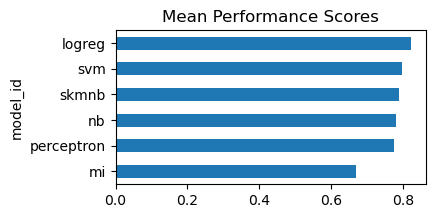

In [12]:
RESULT2.T.mean().sort_values().plot.barh(figsize=(4,2), title="Mean Performance Scores");

In [13]:
METRIC = pd.concat([RESULT2.idxmax(), RESULT2.max(), RESULT2.idxmin(), RESULT2.min()], axis=1, 
                   keys=['argmax','max','argmin','min'])

In [14]:
METRIC.style.format(precision=2)

,argmax,max,argmin,min
accuracy,logreg,0.82,mi,0.67
recall,mi,0.84,skmnb,0.76
specificity,logreg,0.82,mi,0.49
precision,logreg,0.82,mi,0.62
balacc,logreg,0.82,mi,0.67
F1,logreg,0.82,mi,0.72


**Winners**

In [15]:
METRIC.argmax.value_counts()

argmax
logreg    5
mi        1
Name: count, dtype: int64

**Losers**

In [16]:
METRIC.argmin.value_counts()

argmin
mi       5
skmnb    1
Name: count, dtype: int64

# SALEXes

In [44]:
salex_cols = ['valence', 'polarity', 'normalized']

In [45]:
salexes = {model : pd.read_csv(f'{data_home}/{data_prefix}/{data_prefix}-{model}_SALEX.csv').set_index('term_str')
         for model in models}

In [46]:
SALEX = pd.concat([salexes[model][salex_cols] for model in models], keys=models, axis=1)

In [47]:
SALEX

NB                         SKMNB           \
                       valence polarity normalized   valence polarity   
term_str                                                                
informal             -9.725229     -1.0  -1.000000 -4.440498     -1.0   
bland                -9.236306     -1.0  -0.948762 -4.107006     -1.0   
watery               -9.173706     -1.0  -0.942202 -4.064447     -1.0   
pickled              -9.039717     -1.0  -0.928160 -3.973475     -1.0   
diluted              -8.770350     -1.0  -0.899931 -3.791153     -1.0   
...                        ...      ...        ...       ...      ...   
verticality                NaN      NaN        NaN       NaN      NaN   
mahogany                   NaN      NaN        NaN       NaN      NaN   
intellectually             NaN      NaN        NaN       NaN      NaN   
trockenbeerenauslese       NaN      NaN        NaN       NaN      NaN   
execution                  NaN      NaN        NaN       NaN      NaN   

                                       MI                     PERCEPTRON  \
                     normalized   valence polarity normalized    valence   
term_str                                                                   
informal              -1.000000 -6.233101     -1.0  -0.648167      -37.0   
bland                 -0.922868 -4.893281     -1.0  -0.504022      -11.0   
watery                -0.913025 -9.503366     -1.0  -1.000000      -15.0   
pickled               -0.891985 -4.671378     -1.0  -0.480149      -21.0   
diluted               -0.849816 -8.801347     -1.0  -0.924473      -23.0   
...                         ...       ...      ...        ...        ...   
verticality                 NaN  4.608177      1.0   0.518196        NaN   
mahogany                    NaN  4.608177      1.0   0.518196        NaN   
intellectually              NaN  4.608177      1.0   0.518196        NaN   
trockenbeerenauslese        NaN  4.608177      1.0   0.518196        NaN   
execution                   NaN  5.011533      1.0   0.561591        NaN   

                                               SVM                      \
                     polarity normalized   valence polarity normalized   
term_str                                                                 
informal                 -1.0  -0.548387 -1.324370     -1.0  -0.585860   
bland                    -1.0  -0.129032 -0.310590     -1.0  -0.152650   
watery                   -1.0  -0.193548 -0.610297     -1.0  -0.280721   
pickled                  -1.0  -0.290323 -0.569970     -1.0  -0.263489   
diluted                  -1.0  -0.322581 -0.948939     -1.0  -0.425430   
...                       ...        ...       ...      ...        ...   
verticality               NaN        NaN       NaN      NaN        NaN   
mahogany                  NaN        NaN       NaN      NaN        NaN   
intellectually            NaN        NaN       NaN      NaN        NaN   
trockenbeerenauslese      NaN        NaN       NaN      NaN        NaN   
execution                 NaN        NaN       NaN      NaN        NaN   

                        LOGREG                      
                       valence polarity normalized  
term_str                                            
informal             -1.456109     -1.0  -0.630660  
bland                -0.708984     -1.0  -0.385786  
watery               -0.685600     -1.0  -0.378122  
pickled              -0.859738     -1.0  -0.435196  
diluted              -0.913991     -1.0  -0.452978  
...                        ...      ...        ...  
verticality                NaN      NaN        NaN  
mahogany                   NaN      NaN        NaN  
intellectually             NaN      NaN        NaN  
trockenbeerenauslese       NaN      NaN        NaN  
execution                  NaN      NaN        NaN  

[25078 rows x 18 columns]

In [48]:
NORM = SALEX.swaplevel(axis=1).normalized.dropna()

In [49]:
NORM

,NB,SKMNB,MI,PERCEPTRON,SVM,LOGREG
term_str,,,,,,
informal,-1.000000,-1.000000,-0.648167,-0.548387,-0.585860,-0.630660
bland,-0.948762,-0.922868,-0.504022,-0.129032,-0.152650,-0.385786
watery,-0.942202,-0.913025,-1.000000,-0.193548,-0.280721,-0.378122
pickled,-0.928160,-0.891985,-0.480149,-0.290323,-0.263489,-0.435196
diluted,-0.899931,-0.849816,-0.924473,-0.322581,-0.425430,-0.452978
...,...,...,...,...,...,...
2029,0.844655,0.766711,0.829930,0.435484,0.281028,0.094125
2032,0.854381,0.781171,0.876086,0.322581,0.214060,0.015644
exquisite,0.915526,0.872601,0.975737,0.741935,0.636934,0.459942


In [50]:
VOCAB = pd.read_csv(f'{data_home}/{data_prefix}/{data_prefix}-VOCAB.csv').set_index('term_str')

In [51]:
VOCAB

,n
term_str,
000,79
008,1
01,3
02,1
03,3
...,...
église,2
émilion,17
öküzgözü,3


# Compare Models 

Note differences between generative and discriminant models.

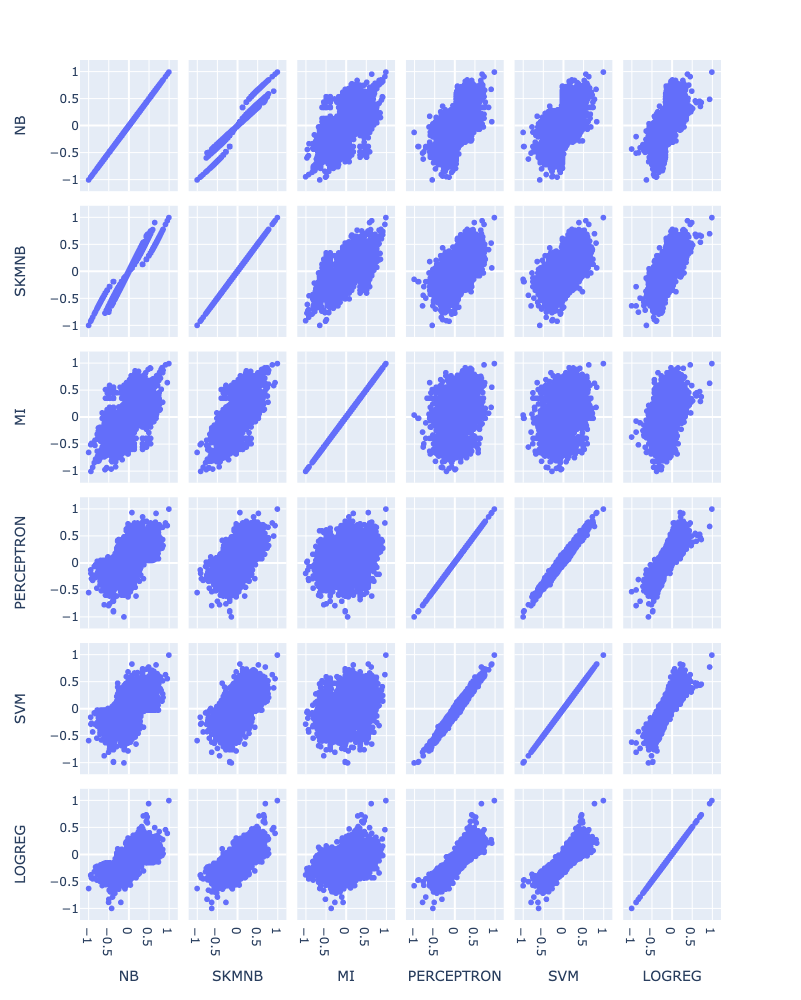

In [52]:
px.scatter_matrix(NORM, height=1000, width=1000)

In [25]:
CORR = NORM.corr().stack().to_frame('r')
CORR.index.names = ['model_1', 'model_2']
CORR = CORR.query("model_1 < model_2")

In [26]:
CORR.sort_values('r', ascending=False).style.format(precision=2).background_gradient(cmap="YlGnBu")

# Means of Normalized Valence

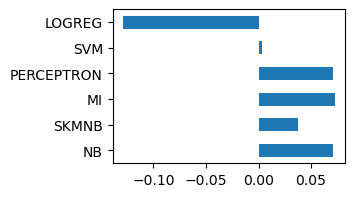

In [53]:
NORM.mean().plot.barh(figsize=(3,2));

# Mean Normalized Valence

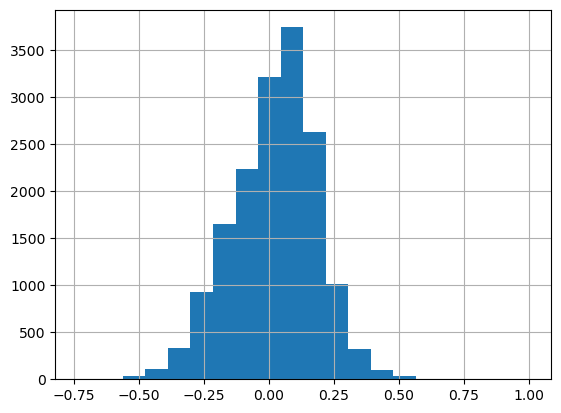

In [54]:
MEAN = NORM.T.mean()
MEAN.hist(bins=20);

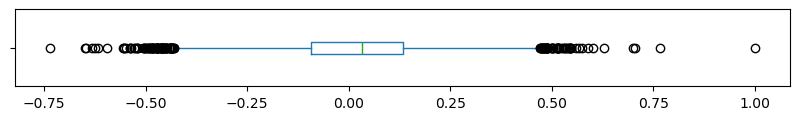

In [55]:
MEAN.plot.box(vert=False, figsize=(10, 1));

In [56]:
pd.concat([MEAN.sort_values(ascending=False).head(20).reset_index().rename(columns={0:'norm_valence'}), 
           MEAN.sort_values(ascending=False).tail(20).sort_values().reset_index().rename(columns={0:'norm_valence'})],
          axis=1, keys=['high', 'low'])

high                     low             
       term_str norm_valence   term_str norm_valence
0            91     1.000000   informal    -0.735512
1     exquisite     0.767113    ripasso    -0.648667
2            92     0.704764    diluted    -0.645868
3          2027     0.699561  torrontés    -0.631170
4    stunningly     0.629099  petroleum    -0.624894
5      glorious     0.600936     watery    -0.617936
6          2030     0.589268      lacks    -0.595595
7     marvelous     0.575676     ruffle    -0.555858
8        sesame     0.567702   leanings    -0.553782
9   magnificent     0.559091     simple    -0.552305
10         2024     0.547036    pickled    -0.548217
11      radiant     0.546586      weedy    -0.538006
12     distance     0.546352      ruddy    -0.537980
13    thrilling     0.545688     verges    -0.535232
14   impeccable     0.542848  vernaccia    -0.527855
15         2029     0.541989   everyday    -0.527105
16   watercress     0.538490   strained    -0.522154
17     gorgeous     0.534851   georgian    -0.521954
18         2025     0.533105     forced    -0.519519
19     resonant     0.531611      bland    -0.507187

# Scatter plots of term frequency

In [66]:
X = NORM.join(VOCAB)
X['mean'] = MEAN

In [67]:
def text(x):
    fig = px.scatter(X.reset_index(), x, 'n', text='term_str', height=800, width=900, title=x)
    fig.update_traces(mode="text")
    fig.show()

## Naive Bayes

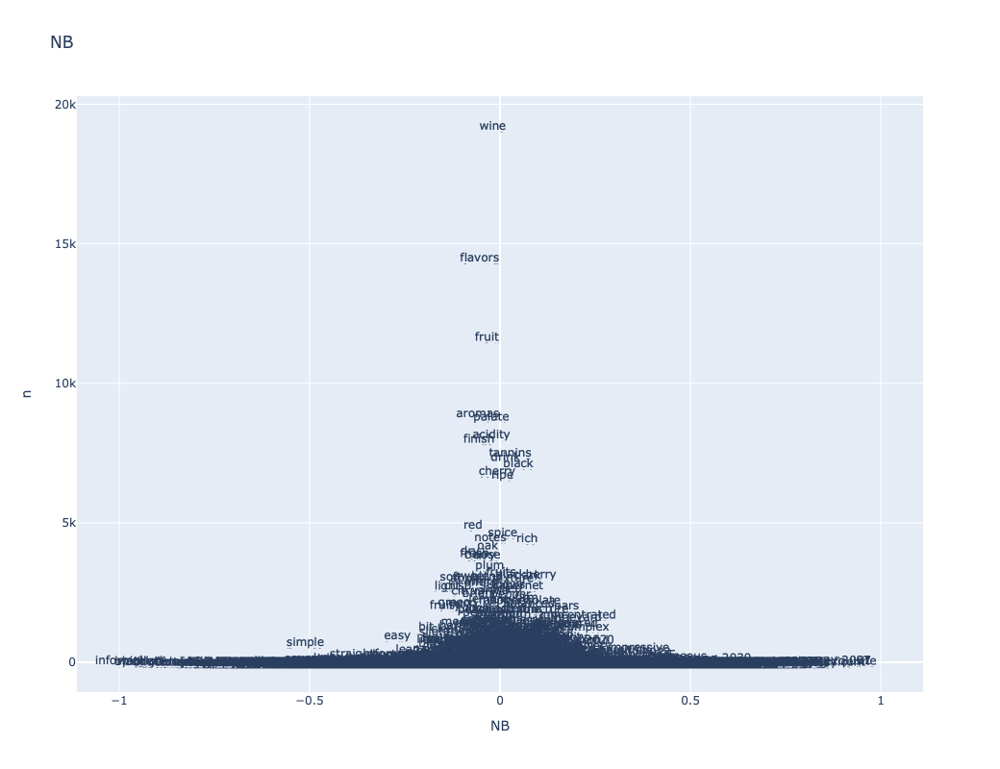

In [68]:
text('NB')

## SK Naive Bayes

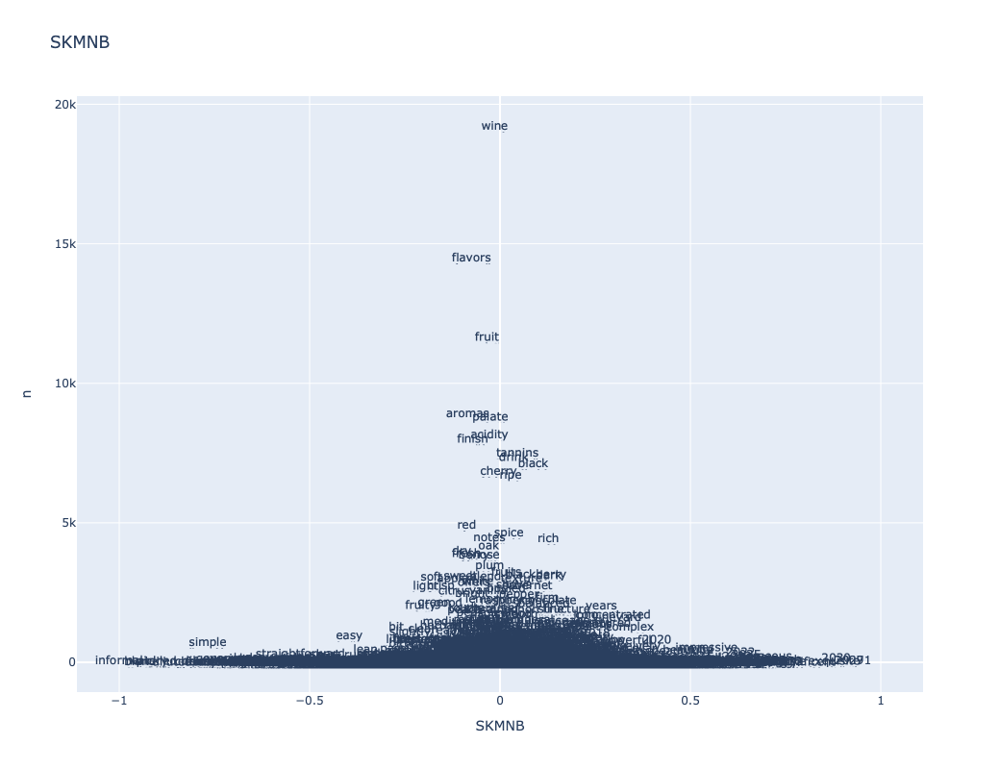

In [35]:
text('SKMNB')

## Perceptron

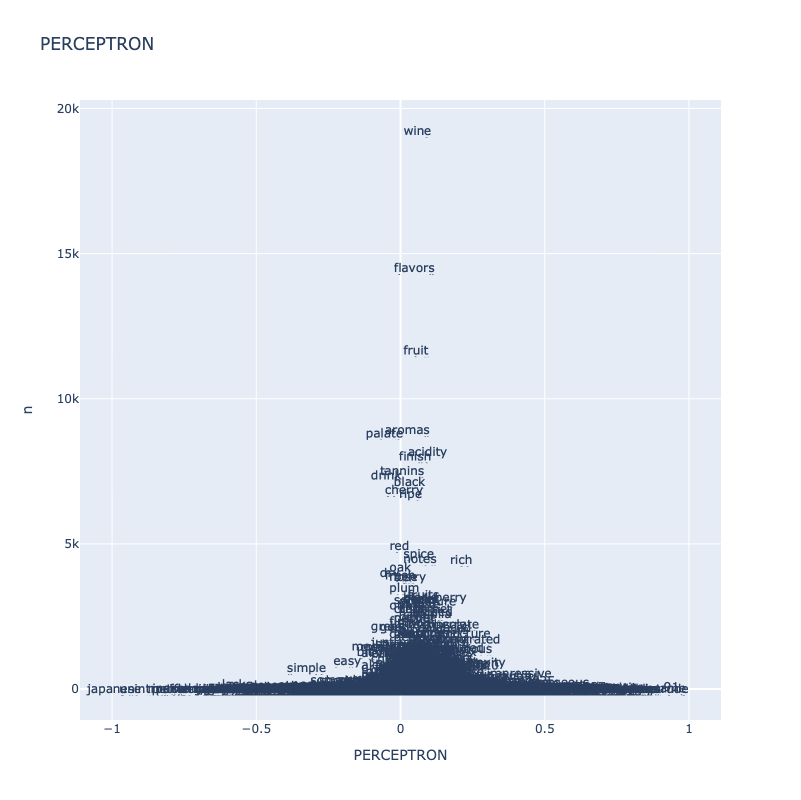

In [36]:
text('PERCEPTRON')

## EMI

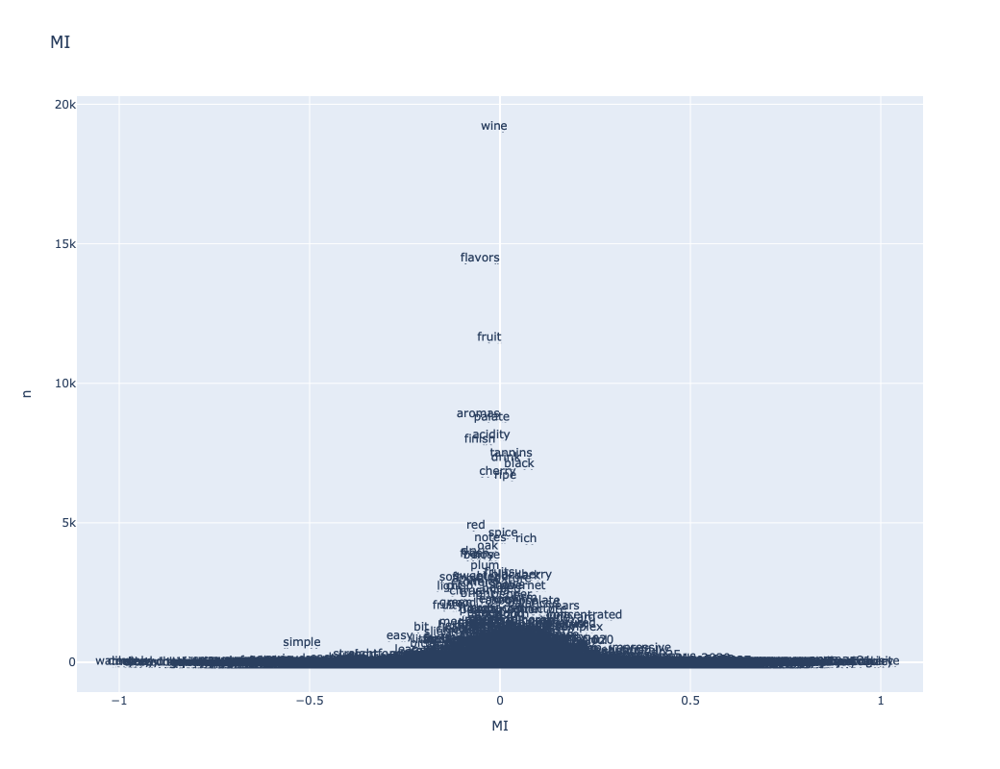

In [37]:
text('MI')

## SVM

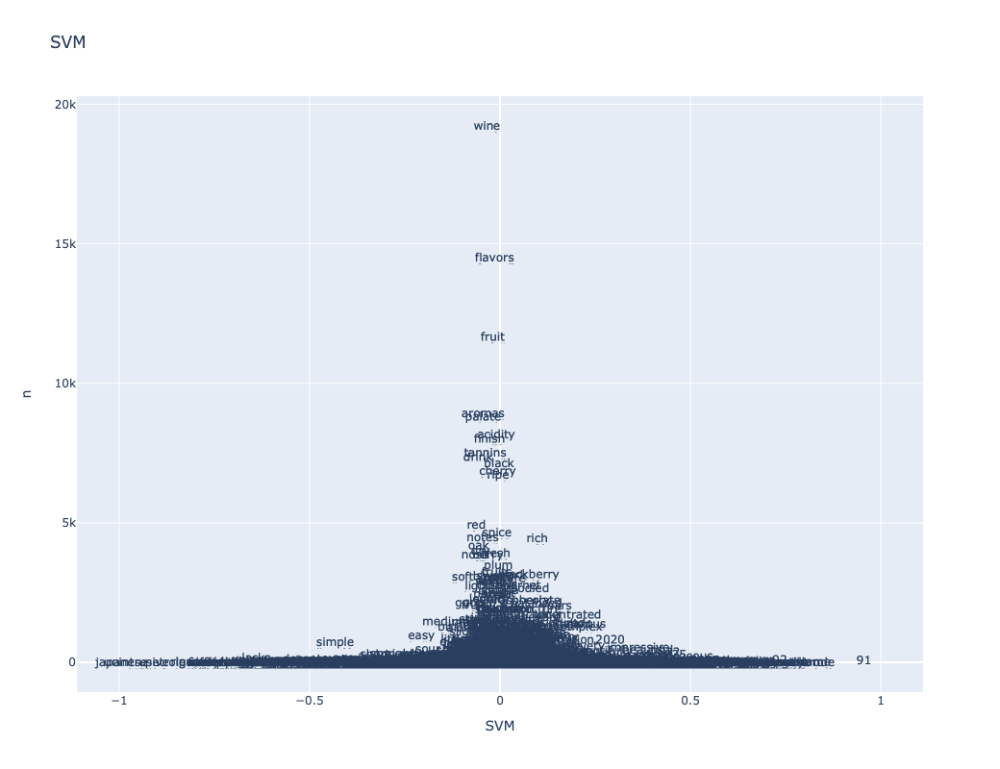

In [38]:
text('SVM')

## LOGREG

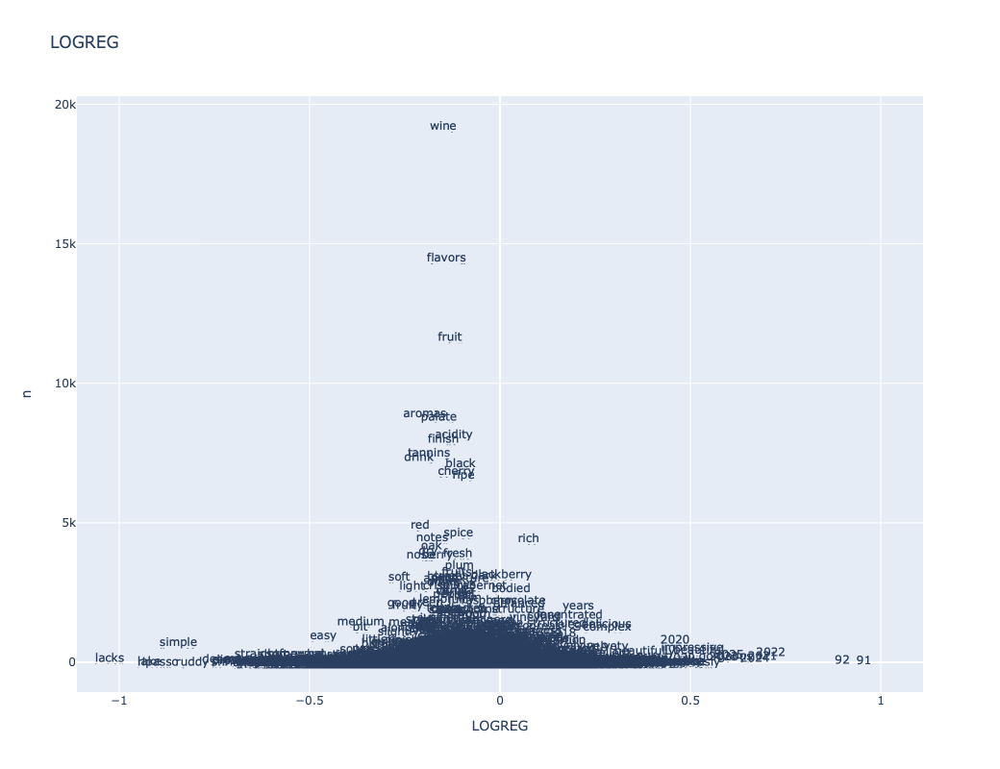

In [39]:
text('LOGREG')

## Mean

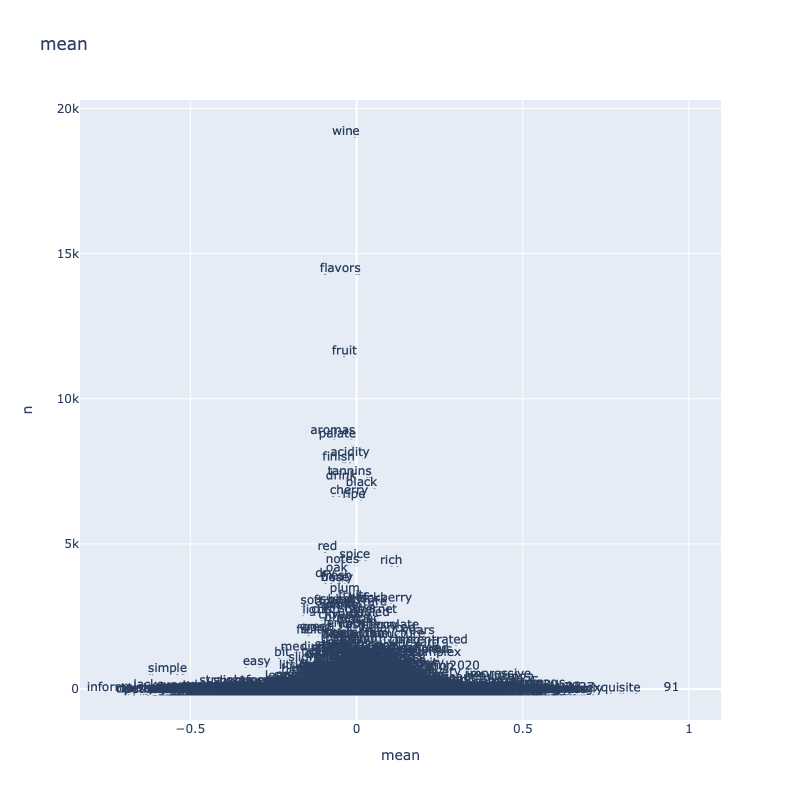

In [40]:
text('mean')

# Observations

- Logistic Regression is the best performer by F1, mean peformance score, performance score wins.
  - Home-grown Naive Bayes is a close second.
  - All perform in the same range excpet Expected Mutual Information (MI).
  - MI is the least balanced with high recall but low specificity and precision.
- The discriminant models are highly correlated to each other, as are the generative ones.
  - The discriminant models are lowly correlated with the generative ones.
  - The two classes of methods seem to produce in-group similar results.
- The generative models appear to produce more intelligible vocabularies.
  - The discriminant models produce some curious negative terms, e.g. 'stonecap', 'venerable', 'distinguish'